# 10 trace plots from 10 walks with only ewkinos

In [1]:
import re
#import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
#import seaborn as sns
import glob
import ast
import plotly.graph_objects as go
from plotly.subplots import make_subplots

In [3]:
#first set of walkers
indices = np.arange(1,11)
#path = "/scratch-cbe/users/sahana.narasimha/real_ewk_2/logs/walker*.log"
path = "/users/sahana.narasimha/real_ewk_3/logs/walker*.log"
log_file = glob.glob(path)
log_file

['/users/sahana.narasimha/real_ewk_3/logs/walker24.log',
 '/users/sahana.narasimha/real_ewk_3/logs/walker1.log',
 '/users/sahana.narasimha/real_ewk_3/logs/walker19.log',
 '/users/sahana.narasimha/real_ewk_3/logs/walker16.log',
 '/users/sahana.narasimha/real_ewk_3/logs/walker25.log',
 '/users/sahana.narasimha/real_ewk_3/logs/walker12.log',
 '/users/sahana.narasimha/real_ewk_3/logs/walker4.log',
 '/users/sahana.narasimha/real_ewk_3/logs/walker5.log',
 '/users/sahana.narasimha/real_ewk_3/logs/walker18.log',
 '/users/sahana.narasimha/real_ewk_3/logs/walker13.log',
 '/users/sahana.narasimha/real_ewk_3/logs/walker23.log',
 '/users/sahana.narasimha/real_ewk_3/logs/walker26.log',
 '/users/sahana.narasimha/real_ewk_3/logs/walker3.log',
 '/users/sahana.narasimha/real_ewk_3/logs/walker29.log',
 '/users/sahana.narasimha/real_ewk_3/logs/walker15.log',
 '/users/sahana.narasimha/real_ewk_3/logs/walker6.log',
 '/users/sahana.narasimha/real_ewk_3/logs/walker8.log',
 '/users/sahana.narasimha/real_ewk_3/

In [6]:
#second set of walkers
path2 = "/scratch-cbe/users/sahana.narasimha/bsm_run_ewkinos/logs/walker*.log"
log_file2 = glob.glob(path2)
log_file2

['/scratch-cbe/users/sahana.narasimha/bsm_run_ewkinos/logs/walker20.log',
 '/scratch-cbe/users/sahana.narasimha/bsm_run_ewkinos/logs/walker18.log',
 '/scratch-cbe/users/sahana.narasimha/bsm_run_ewkinos/logs/walker19.log',
 '/scratch-cbe/users/sahana.narasimha/bsm_run_ewkinos/logs/walker15.log',
 '/scratch-cbe/users/sahana.narasimha/bsm_run_ewkinos/logs/walker11.log',
 '/scratch-cbe/users/sahana.narasimha/bsm_run_ewkinos/logs/walker17.log',
 '/scratch-cbe/users/sahana.narasimha/bsm_run_ewkinos/logs/walker13.log',
 '/scratch-cbe/users/sahana.narasimha/bsm_run_ewkinos/logs/walker16.log',
 '/scratch-cbe/users/sahana.narasimha/bsm_run_ewkinos/logs/walker12.log',
 '/scratch-cbe/users/sahana.narasimha/bsm_run_ewkinos/logs/walker14.log']

In [4]:
#Get the step at which the first set of walks stopped at
num = np.arange(1,11)
steps = []
for i in num:
    step_list = []
    filename1 = f"/scratch-cbe/users/sahana.narasimha/bsm_run_ewkinos/logs/walker{i}.log"
    #filename2 = f"/Users/sahananarasimha/protomodels/log_files_from_clip/test_ewkinos/walker{num+10}.log"
    #file1 = open(filename1,'r')
    #file2 = open(filename2,'r')
    step_pattern = re.compile(r'\[randomWalker.*\] Step (\d+) begins')
    with open(filename1, 'r') as file:
        for line in file:
            step_match = step_pattern.search(line)
            if step_match:
                current_step = int(step_match.group(1))
                step_list.append(current_step)
    steps.append(step_list)

step_dict = {}
for i,step in enumerate(steps):
    #print(f"{i+1}. Last Step = {step[-1]}")
    step_dict[i+1] = step[-1]

print(step_dict)

FileNotFoundError: [Errno 2] No such file or directory: '/scratch-cbe/users/sahana.narasimha/bsm_run_ewkinos/logs/walker1.log'

In [7]:
#Get the step at which the second set of walks starts at
num = np.arange(1,11)
steps = []
for i in num:
    step_list = []
    filename1 = f"/scratch-cbe/users/sahana.narasimha/bsm_run_ewkinos/logs/walker{10+i}.log"
    #filename2 = f"/Users/sahananarasimha/protomodels/log_files_from_clip/test_ewkinos/walker{num+10}.log"
    #file1 = open(filename1,'r')
    #file2 = open(filename2,'r')
    step_pattern = re.compile(r'\[randomWalker.*\] Step (\d+) begins')
    with open(filename1, 'r') as file:
        for line in file:
            step_match = step_pattern.search(line)
            if step_match:
                current_step = int(step_match.group(1))
                step_list.append(current_step)
    steps.append(step_list)

step_dict = {}
for i,step in enumerate(steps):
    #print(f"{i+1}. Last Step = {step[-1]}")
    step_dict[i+1] = step[0]

print(step_dict)

{1: 1259, 2: 929, 3: 4468, 4: 4910, 5: 4326, 6: 1654, 7: 4475, 8: 6147, 9: 1754, 10: 5738}


### Combine the two sets of runs 


In [7]:
last_step = []
for i in num:    
    filename1 = f"/scratch-cbe/users/sahana.narasimha/bsm_run_ewkinos/logs/walker{i}.log"
    filename2 = f"/scratch-cbe/users/sahana.narasimha/bsm_run_ewkinos/logs/walker{i + 10}.log"
    #filename3 = f"/scratch-cbe/users/sahana.narasimha/bsm_run_all/logs/walker{i*10 + 1}.log"
    #file1 = open(filename1,'r')
    #file2 = open(filename2,'r')
    step_pattern = f"Step {step_dict[i]} begins"
    sp2 = "Was asked to stop after 100000 steps"
    if step_dict[i]%1000 == 0: step_pattern = f"Step {step_dict[i]+1} begins"
    print(i, step_dict[i], step_pattern)
    of1 = f"/scratch-cbe/users/sahana.narasimha/bsm_run_ewkinos/new_logs/walker{i}.log"
    step_pattern2 = re.compile(r'\[randomWalker.*\] Step (\d+) begins')
    ctr , current_step = 0,0
    with open(of1,'w') as of:
        with open(filename1, 'r') as file:
            for line in file:
                if step_pattern in line:            #reached the last step in the first run
                    print(f"walker{i}, {line}")
                    break
                if sp2 in line:
                    print(f"walker{i}, {line}")
                    break
                of.write(line)
        with open(filename2,'r') as file:
            print(f"walker{i+10}")
            for line in file:               
                if step_pattern in line:            #start from the last step from the prev run 
                    print(f"walker{i+10}, {line}")
                    ctr = 1
                if ctr == 0: 
                    #print(f"{filename2}, {line}")
                    continue
                
                of.write(line)
                step_match = step_pattern2.search(line)
                if step_match:
                    current_step = int(step_match.group(1))

        #last_step.append(current_step)
        ctr = 0 
        print(f"Last step {current_step}")
        '''
        step_pattern = f"Step {current_step} begins"
        sp2 = f"Was asked to stop after {current_step} steps"
        if step_dict[i]%1000 == 0: step_pattern = f"Step {current_step+1} begins" 
       
        with open(filename3,'r') as file:
            print(f"walker{i*10 + 1}")
            for line in file:               
                if step_pattern in line: 
                    print(f"walker{i*10 + 1}, {line}")
                    ctr = 1
                if ctr == 0: 
                    #print(f"{filename2}, {line}")
                    continue
                
                of.write(line)
                step_match = step_pattern2.search(line)
                if step_match:
                    current_step = int(step_match.group(1))
        '''
        last_step.append(current_step) 

for i in num:
    print(f"walker{i}, last step {last_step[i-1]}")

1 5100 Step 5100 begins
walker1, [randomWalker-17:56:46] Step 5100 begins.

walker11
walker11, [randomWalker-20:36:33] Step 5100 begins.

Last step 7612
2 3950 Step 3950 begins
walker2, [randomWalker-16:55:56] Step 3950 begins.

walker12
walker12, [randomWalker-20:21:20] Step 3950 begins.

Last step 7411
3 4140 Step 4140 begins
walker3, [randomWalker-18:03:38] Step 4140 begins.

walker13
walker13, [randomWalker-20:16:22] Step 4140 begins.

Last step 10547
4 3241 Step 3241 begins
walker4, [randomWalker-17:59:55] Step 3241 begins.

walker14
walker14, [randomWalker-20:19:27] Step 3241 begins.

Last step 6750
5 2168 Step 2168 begins
walker5, [randomWalker-08:45:15] Step 2168 begins.

walker15
walker15, [randomWalker-20:16:40] Step 2168 begins.

Last step 5947
6 2197 Step 2197 begins


walker6, [randomWalker-17:46:55] Step 2197 begins.

walker16
walker16, [randomWalker-20:40:12] Step 2197 begins.

Last step 2580
7 5229 Step 5229 begins
walker7, [randomWalker-18:00:33] Step 5229 begins.

walker17
walker17, [randomWalker-20:24:09] Step 5229 begins.

Last step 7614
8 4971 Step 4971 begins
walker8, [randomWalker-18:02:45] Step 4971 begins.

walker18
walker18, [randomWalker-20:23:48] Step 4971 begins.

Last step 8645
9 1315 Step 1315 begins
walker9, [randomWalker-17:57:07] Step 1315 begins.

walker19
walker19, [randomWalker-20:27:40] Step 1315 begins.

Last step 2624
10 4706 Step 4706 begins
walker10, [randomWalker-18:03:34] Step 4706 begins.

walker20
walker20, [randomWalker-20:17:24] Step 4706 begins.

Last step 8673
walker1, last step 7612
walker2, last step 7411
walker3, last step 10547
walker4, last step 6750
walker5, last step 5947
walker6, last step 2580
walker7, last step 7614
walker8, last step 8645
walker9, last step 2624
walker10, last step 8673


In [17]:
# Read over the new sets of combined log files
path = "/scratch-cbe/users/sahana.narasimha/bsm_run_ewkinos/new_logs/hiscore_walker*.log"
log_file = glob.glob(path)
log_file

['/scratch-cbe/users/sahana.narasimha/bsm_run_ewkinos/new_logs/hiscore_walker14.log',
 '/scratch-cbe/users/sahana.narasimha/bsm_run_ewkinos/new_logs/hiscore_walker16.log',
 '/scratch-cbe/users/sahana.narasimha/bsm_run_ewkinos/new_logs/hiscore_walker17.log',
 '/scratch-cbe/users/sahana.narasimha/bsm_run_ewkinos/new_logs/hiscore_walker18.log',
 '/scratch-cbe/users/sahana.narasimha/bsm_run_ewkinos/new_logs/hiscore_walker19.log',
 '/scratch-cbe/users/sahana.narasimha/bsm_run_ewkinos/new_logs/hiscore_walker12.log',
 '/scratch-cbe/users/sahana.narasimha/bsm_run_ewkinos/new_logs/hiscore_walker11.log',
 '/scratch-cbe/users/sahana.narasimha/bsm_run_ewkinos/new_logs/hiscore_walker15.log',
 '/scratch-cbe/users/sahana.narasimha/bsm_run_ewkinos/new_logs/hiscore_walker20.log',
 '/scratch-cbe/users/sahana.narasimha/bsm_run_ewkinos/new_logs/hiscore_walker13.log']

In [18]:
def read_log_file(file_path):
    
    step_list,muhat_list,proto_list,accratio_list = [],[],[],[]

    step_pattern = re.compile(r'\[randomWalker.*\] Step (\d+) begins')
    muhat_pattern = re.compile(r'with muhat ([\d.]+)')
    proto_pattern = re.compile(r"Protomodel: ({.*})")
    accratio_pattern = re.compile(r"Acceptance ratio (\d+(\.\d+)?)")

    none_pattern = re.compile(r'K is none, return to previous model') #need this when the second set of runs do not print the protomodel

    current_step = None
    current_muhat = np.nan
    current_proto = {}
    current_accratio = 0.0
    ctr = 0
    with open(file_path, 'r') as file:
        for line in file:
            step_match = step_pattern.search(line)
            if step_match:
                if current_step:
                    step_list.append(current_step)
                    muhat_list.append(current_muhat)
                    proto_list.append(current_proto)
                    accratio_list.append(current_accratio)

                current_step = int(step_match.group(1))
                #if current_step > 1400: print(current_step)
                current_muhat = np.nan
                current_proto = {}
                current_accratio = 0.0

            none_match = none_pattern.search(line)
            muhat_match = muhat_pattern.search(line)
            proto_match = proto_pattern.search(line)
            accratio_match = accratio_pattern.search(line)
            ctr = 0
            if muhat_match:
                ctr += 1
                try:
                    current_muhat = float(muhat_match.group(1))
                except ValueError:
                    current_muhat = np.nan

            if proto_match:
                ctr += 1
                current_proto = eval(proto_match.group(1))

            if accratio_match:
                ctr += 1
                current_accratio = float(accratio_match.group(1))
            
            if none_match:
                if ctr != 3:            #if the protomodel is not printed because muhat did not converge to 1 in the second set of runs
                    current_muhat = None
                    current_proto = {}
                    current_accratio = None
            
        if current_step:
            step_list.append(current_step)
            muhat_list.append(current_muhat)
            proto_list.append(current_proto)
            accratio_list.append(current_accratio)
    
    return step_list, muhat_list, proto_list, accratio_list

In [19]:
def get_proto_par(proto):
    
    accepted = proto['Accepted']
    K = proto['K']
    TL = proto['TL']
    return accepted, K, TL

def get_all_proto(step_list, proto_list):
    acc_list, K_list, TL_list,steps = [],[],[],[]
    for i,proto in enumerate(proto_list):
        if proto == {}:         #if the protomodel is not printed because muhat did not converge to 1
            steps.append(step_list[i])
            K_list.append(None)
            TL_list.append(None)
            acc_list.append(2)
            continue
        acc, K, TL = get_proto_par(proto)
        acc_list.append(acc)
        K_list.append(K)
        TL_list.append(TL)
    print(steps)
    K_list,TL_list = plot_trace_K(step_list, acc_list, K_list, TL_list)
    return K_list, TL_list

In [22]:
def plot_trace_K(step_list, accepted, K, TL):
    K_list,TL_list = [],[]
    #step_list  = step_list[:-1]
    ind_acc = 0
    
    for i,acc in enumerate(accepted):
        if acc == 0:
            ind_acc = i
            if K[i] is not None:
                K_list.append(K[i])
                TL_list.append(TL[i])
                #if i%1000==0: print(f"{i}, Step: {step_list[i]}, accepted: Current K {K[i]}, accepting K {K[ind_acc]}")
                #print(f"{i}, {ind_acc}, ki {K[i]}, kacc {K[ind_acc]}, {K[i]==K[ind_acc]}")
            else: 
                if ind_acc == 0: 
                    K_list.append(None)
                    TL_list.append(None)
                    continue
                ind_acc = i-1
                K_list.append(K[i-1])
                TL_list.append(TL[i-1])
                
        else:
            if K[ind_acc] is not None: 
                K_list.append(K[ind_acc])
                TL_list.append(TL[ind_acc])
                #if i%1000==0: print(f"{i}, Step: {step_list[i]}, Not accepted: Current K {K[i]}, accepting K {K[ind_acc]}")
                #print(f"{i}, {ind_acc}, ki {K[i]}, kacc {K[ind_acc]}, {K[i]==K[ind_acc]}")
            else:
                if ind_acc == 0: 
                    K_list.append(None)
                    TL_list.append(None)
                    continue
                K_list.append(K[i-1])
                TL_list.append(TL[i-1]) 
                print(f"{i}, error, Step : {step_list[i]}, K: {K[i]}, TL: {TL[i]}, accepted K: {K_list[i]}")
        #if i in range(4141, 4151):
        #    print(f"{i}, Step : {step_list[i]}, K: {K[i]}, TL: {TL[i]}, accepted K: {K_list[i]}")
    if len(step_list) != len(K_list):
        if len(step_list) < len(K_list): step_list.append(step_list[-1]+1)
        else: step_list = step_list[:-1]
    
    #print(K_list[6607:6615])
    #print(TL_list[6607:6615])
    # Create a figure with two subplots
    
    fig = make_subplots(rows=2, cols=1, shared_xaxes=True, subplot_titles=["K vs Step", "TL vs Step"])

    # First subplot (K)
    fig.add_trace(go.Scatter(x=step_list, y=K_list, mode='lines', name='K'), row=1, col=1)

    # Second subplot (TL)
    fig.add_trace(go.Scatter(x=step_list, y=TL_list, mode='lines', name='TL'), row=2, col=1)

    # Update layout
    fig.update_layout(height=500, width=800, title_text="K and TL vs Step", showlegend=False)
    fig.update_xaxes(title_text="Step", row=2, col=1)
    fig.update_yaxes(title_text="K", row=1, col=1)
    fig.update_yaxes(title_text="TL", row=2, col=1)

    import plotly.io as pio
    pio.renderers.default = "vscode"  # or "jupyterlab"
    #import plotly.io as pio
    pio.show(fig)
    
    return K_list, TL_list

def plot_num_of_par(step_list, proto_list, K_list):
    step_list = step_list[:-1]
    num_list = []
    ind_acc = 0
    for i,proto in enumerate(proto_list):
        if proto == {}: continue
        acc = proto['Accepted']
        num_par = len(proto['masses'].keys())
        K = proto['K']
        if acc == 0:   
            num_list.append(num_par)
            ind_acc =i
        else:
            proto_prev = proto_list[ind_acc]
            num_par = len(proto_prev['masses'].keys())
            num_list.append(num_par)
    
    fig = go.Figure()

    # First y-axis (Num)
    fig.add_trace(go.Scatter(x=step_list, y=num_list, mode='lines', name='Num', 
                            line=dict(color='blue', width=2), opacity=0.6, yaxis='y1'))

    # Second y-axis (K)
    fig.add_trace(go.Scatter(x=step_list, y=K_list, mode='lines', name='K', 
                            line=dict(color='red', width=2), opacity=0.4, yaxis='y2'))

    # Update layout for dual axes
    fig.update_layout(title="Num and K vs Step",
        xaxis=dict(title="Step"),
        yaxis=dict(title=dict(text="Num", font=dict(color="blue")), tickfont=dict(color="blue")),
        yaxis2=dict(title=dict(text="K", font=dict(color="red")), tickfont=dict(color="red"),
                    overlaying='y', side='right'),
        legend=dict(x=0.7, y=1.1),
        width=800, height=500
    )
    
    import plotly.io as pio
    pio.renderers.default = "vscode"  # or "jupyterlab"
    #import plotly.io as pio
    pio.show(fig)
    '''
    fig, ax1 = plt.subplots(1, 1, figsize=(10, 5))
    ax1.plot(step_list, num_list, color='b', label='num', alpha=0.5)
    ax1.set_xlabel('step')
    ax1.set_ylabel('Num of par')

    ax2 = ax1.twinx()
    ax2.plot(step_list, K_list, color='r', label='K', alpha=0.4)
    ax2.set_ylabel('K')
    ax1.legend(loc='upper left')
    ax2.legend(loc='upper right')
    plt.show()
    '''

def plot_mass_of_lsp(step_list, proto_list):
    #step_list = step_list[:-1]
    mass_list,TL_list = [],[]
    ind_acc = 0
    for i,proto in enumerate(proto_list):
        if proto == {}: continue
        acc = proto['Accepted']
        mass_lsp = float(proto['masses'][1000022])
        TL = proto['K']
        if acc == 0:   
            mass_list.append(mass_lsp)
            TL_list.append(TL)
            ind_acc =i
        else:
            proto_prev = proto_list[ind_acc]
            mass_lsp = float(proto_prev['masses'][1000022])
            TL = proto_prev['K']
            mass_list.append(mass_lsp)
            TL_list.append(TL)
    
    if len(step_list) != len(mass_list):
        if len(step_list) < len(mass_list): step_list.append(step_list[-1]+1)
        else: step_list = step_list[:-1]

    
    fig = go.Figure()

    # First y-axis (Mass)
    fig.add_trace(go.Scatter(x=step_list, y=mass_list, mode='lines', name='Mass', 
                            line=dict(color='blue', width=2), opacity=0.6, yaxis='y1'))

    # Second y-axis (TL)
    fig.add_trace(go.Scatter(x=step_list, y=TL_list, mode='lines', name='K', 
                            line=dict(color='red', width=2), opacity=0.4, yaxis='y2'))

    # Update layout for dual axes
    fig.update_layout(title="Mass and K vs Step",
        xaxis=dict(title="Step"),
        yaxis=dict(title=dict(text="Mass", font=dict(color="blue")), tickfont=dict(color="blue")),
        yaxis2=dict(title=dict(text="K", font=dict(color="red")), tickfont=dict(color="red"),
                    overlaying='y', side='right'),
        legend=dict(x=0.7, y=1.1),
        width=800, height=500
    )
    
    import plotly.io as pio
    pio.renderers.default = "vscode"  # or "jupyterlab"
    #import plotly.io as pio
    pio.show(fig)
    #fig.show()
    '''
    fig, ax1 = plt.subplots(1, 1, figsize=(10, 5))
    ax1.plot(step_list, mass_list, color='b', label='num', alpha=0.6)
    ax1.set_xlabel('step')
    ax1.set_ylabel('Mass')
    
    ax2 = ax1.twinx()
    ax2.plot(step_list, TL_list, color='r', label='TL', alpha=0.4)
    ax2.set_ylabel('TL')
    ax1.legend(loc='upper left')
    ax2.legend(loc='upper right')
    plt.ion()
    plt.show()
    '''

In [23]:
K_lists,TL_lists = [],[]
step_lists = []
proto_lists = []
for i,file in enumerate(log_file):
    #if i==9:
    filename = file.split('/')[-1]
    print(f"{filename}")
    step_list, muhat_list, proto_list,accratio_list = read_log_file(file)
    print(len(step_list))
    K_list,TL_list = get_all_proto(step_list, proto_list)
    K_lists.append(K_list)
    TL_lists.append(TL_list)
    step_lists.append(step_list)
    proto_lists.append(proto_list)

hiscore_walker14.log
6752
[1, 2, 6, 8, 11, 14, 18, 19, 21, 22, 23, 26, 46, 50, 51, 59, 60, 66, 70, 73, 96, 100, 103, 114, 123, 127, 128, 134, 143, 149, 153, 175, 198, 209, 210, 243, 255, 259, 266, 267, 269, 272, 275, 300, 325, 339, 343, 355, 357, 362, 364, 368, 369, 373, 375, 385, 395, 399, 403, 405, 407, 409, 410, 411, 413, 414, 416, 417, 418, 419, 432, 433, 435, 437, 447, 463, 464, 474, 482, 484, 487, 495, 499, 510, 511, 512, 513, 524, 529, 535, 550, 561, 570, 574, 578, 582, 610, 613, 620, 622, 629, 633, 637, 642, 674, 676, 681, 691, 694, 703, 704, 705, 723, 724, 743, 744, 756, 786, 787, 798, 866, 868, 870, 880, 885, 886, 898, 901, 912, 914, 929, 932, 934, 936, 944, 985, 992, 995, 998, 1003, 1004, 1036, 1052, 1079, 1080, 1086, 1088, 1091, 1095, 1096, 1104, 1110, 1111, 1124, 1144, 1145, 1152, 1157, 1158, 1176, 1186, 1199, 1203, 1204, 1218, 1225, 1234, 1289, 1308, 1309, 1311, 1319, 1323, 1340, 1350, 1353, 1357, 1395, 1398, 1411, 1415, 1421, 1429, 1430, 1432, 1450, 1452, 1453, 1454, 145

hiscore_walker16.log
4354
[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 30, 35, 38, 42, 43, 44, 49, 51, 56, 60, 61, 66, 68, 73, 86, 91, 104, 108, 109, 113, 120, 125, 129, 131, 147, 150, 168, 169, 170, 174, 176, 182, 185, 197, 199, 201, 202, 207, 217, 218, 224, 226, 232, 234, 237, 247, 251, 256, 260, 264, 266, 268, 270, 274, 276, 277, 278, 281, 293, 300, 306, 307, 334, 335, 337, 344, 354, 367, 369, 379, 384, 403, 415, 418, 443, 444, 456, 457, 463, 470, 481, 504, 516, 529, 549, 553, 555, 570, 574, 582, 588, 594, 596, 598, 621, 624, 633, 646, 647, 649, 652, 661, 669, 697, 703, 715, 717, 732, 738, 742, 747, 748, 763, 769, 789, 791, 799, 812, 840, 860, 866, 877, 890, 902, 919, 927, 928, 933, 970, 971, 979, 993, 999, 1011, 1014, 1022, 1032, 1036, 1044, 1065, 1086, 1089, 1090, 1094, 1095, 1096, 1099, 1106, 1109, 1110, 1113, 1114, 1118, 1133, 1144, 1151, 1154, 1155, 1184, 1188, 1195, 1198, 1201, 1202, 1206, 1219, 1221, 1224, 1225, 1226, 1232, 1

hiscore_walker17.log
6010
[1, 2, 16, 20, 21, 22, 23, 24, 28, 29, 31, 35, 45, 47, 55, 57, 61, 76, 82, 85, 97, 116, 125, 130, 131, 135, 136, 138, 143, 146, 147, 150, 154, 168, 170, 175, 183, 186, 213, 224, 250, 251, 254, 282, 287, 289, 303, 305, 313, 317, 320, 323, 326, 327, 330, 337, 340, 347, 350, 360, 377, 393, 401, 404, 406, 425, 426, 427, 432, 437, 440, 449, 463, 471, 475, 484, 485, 500, 501, 504, 510, 517, 520, 521, 537, 547, 548, 562, 563, 597, 602, 604, 607, 608, 612, 620, 622, 623, 628, 629, 630, 635, 641, 643, 649, 655, 671, 684, 690, 692, 695, 703, 709, 710, 713, 729, 739, 750, 757, 821, 825, 830, 835, 838, 839, 843, 870, 888, 891, 895, 922, 928, 929, 930, 939, 940, 952, 953, 972, 973, 986, 1000, 1003, 1006, 1025, 1032, 1035, 1054, 1060, 1077, 1078, 1087, 1088, 1101, 1104, 1111, 1112, 1116, 1124, 1135, 1140, 1141, 1149, 1150, 1161, 1162, 1173, 1186, 1190, 1191, 1218, 1220, 1225, 1235, 1241, 1267, 1272, 1273, 1278, 1280, 1284, 1291, 1297, 1304, 1310, 1314, 1320, 1321, 1322, 132

hiscore_walker18.log
10334
[1, 2, 3, 4, 5, 18, 28, 51, 56, 59, 72, 85, 89, 103, 117, 124, 128, 137, 143, 162, 169, 174, 175, 179, 220, 221, 222, 229, 232, 246, 247, 254, 275, 278, 291, 300, 320, 327, 328, 333, 349, 380, 384, 385, 390, 392, 393, 402, 407, 442, 444, 495, 497, 499, 500, 502, 506, 507, 515, 518, 533, 539, 544, 545, 547, 572, 573, 576, 578, 581, 628, 630, 631, 635, 638, 642, 643, 644, 649, 652, 654, 655, 658, 663, 666, 667, 668, 674, 676, 681, 683, 692, 713, 718, 727, 729, 731, 736, 748, 777, 786, 826, 827, 829, 837, 849, 854, 865, 873, 880, 892, 895, 900, 906, 924, 931, 946, 977, 981, 998, 999, 1006, 1008, 1012, 1018, 1023, 1030, 1032, 1033, 1034, 1040, 1049, 1055, 1058, 1063, 1071, 1077, 1084, 1105, 1108, 1111, 1123, 1125, 1129, 1139, 1143, 1145, 1153, 1160, 1165, 1167, 1191, 1206, 1212, 1234, 1243, 1249, 1253, 1290, 1294, 1301, 1303, 1308, 1311, 1312, 1316, 1323, 1328, 1332, 1340, 1343, 1351, 1375, 1392, 1395, 1396, 1404, 1408, 1411, 1415, 1423, 1425, 1433, 1443, 1447, 1

hiscore_walker19.log
3948
[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 19, 23, 28, 29, 31, 32, 39, 42, 43, 44, 45, 50, 51, 52, 57, 60, 61, 62, 64, 65, 68, 70, 76, 78, 79, 83, 87, 88, 90, 101, 103, 105, 111, 112, 113, 118, 123, 128, 129, 134, 148, 149, 152, 156, 187, 191, 210, 224, 225, 227, 228, 242, 260, 263, 266, 270, 273, 293, 295, 340, 342, 351, 355, 357, 360, 365, 406, 415, 418, 420, 432, 438, 446, 450, 453, 456, 459, 462, 472, 474, 477, 479, 482, 497, 505, 509, 515, 518, 521, 523, 524, 540, 541, 553, 560, 566, 569, 572, 579, 581, 583, 585, 587, 602, 605, 606, 613, 618, 630, 652, 689, 721, 725, 727, 735, 736, 738, 743, 748, 753, 757, 762, 768, 773, 778, 798, 808, 811, 831, 834, 839, 851, 852, 859, 877, 887, 894, 895, 901, 903, 915, 919, 920, 929, 930, 959, 963, 965, 967, 979, 980, 981, 982, 983, 984, 986, 1010, 1021, 1022, 1027, 1034, 1035, 1042, 1043, 1049, 1051, 1053, 1054, 1055, 1072, 1076, 1090, 1097, 1102, 1103, 1108, 1110, 1118, 1121, 1122, 1123, 1146, 1148, 1149, 1159, 1161, 1162, 1

hiscore_walker12.log
3692
[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 20, 24, 25, 27, 28, 29, 35, 42, 59, 64, 69, 87, 107, 113, 131, 143, 168, 178, 183, 206, 207, 209, 211, 213, 214, 215, 219, 223, 227, 229, 249, 255, 265, 266, 269, 275, 285, 287, 288, 289, 293, 295, 298, 304, 311, 317, 319, 321, 325, 328, 330, 332, 335, 341, 383, 413, 426, 428, 438, 450, 457, 468, 470, 473, 476, 486, 504, 511, 516, 517, 520, 527, 528, 532, 552, 558, 590, 599, 612, 614, 615, 628, 633, 645, 660, 667, 668, 669, 672, 673, 679, 695, 696, 700, 707, 718, 723, 725, 737, 739, 740, 743, 746, 747, 752, 754, 755, 756, 757, 758, 761, 771, 789, 802, 841, 852, 855, 876, 884, 889, 891, 893, 901, 902, 906, 916, 918, 920, 923, 958, 966, 970, 973, 980, 995, 1004, 1005, 1006, 1037, 1045, 1073, 1099, 1103, 1109, 1111, 1120, 1128, 1136, 1138, 1143, 1145, 1163, 1216, 1217, 1219, 1227, 1233, 1237, 1238, 1258, 1268, 1280, 1300, 1304, 1305, 1309, 1312, 1313, 1324, 1332, 1379, 1380, 1402, 1403, 1408, 1409, 1

hiscore_walker11.log
4448
[1, 2, 3, 4, 5, 6, 7, 11, 12, 13, 14, 15, 16, 17, 29, 33, 34, 42, 44, 46, 47, 55, 56, 59, 67, 71, 73, 80, 86, 87, 88, 93, 94, 97, 101, 106, 109, 115, 119, 121, 122, 125, 129, 134, 156, 159, 160, 177, 191, 197, 201, 210, 212, 224, 225, 251, 273, 285, 294, 298, 316, 336, 337, 342, 352, 359, 365, 372, 376, 383, 401, 425, 441, 459, 462, 475, 476, 478, 486, 494, 504, 506, 508, 522, 524, 534, 568, 571, 577, 580, 587, 590, 594, 600, 627, 645, 647, 649, 654, 657, 660, 669, 686, 692, 693, 695, 716, 722, 749, 761, 764, 768, 769, 771, 773, 774, 802, 803, 810, 821, 827, 828, 835, 856, 862, 870, 882, 903, 904, 906, 907, 909, 913, 924, 928, 945, 961, 968, 970, 1011, 1019, 1026, 1028, 1053, 1058, 1059, 1068, 1090, 1096, 1099, 1100, 1106, 1107, 1112, 1123, 1130, 1133, 1140, 1143, 1149, 1153, 1159, 1172, 1174, 1177, 1182, 1185, 1186, 1204, 1208, 1215, 1221, 1225, 1287, 1335, 1360, 1433, 1434, 1441, 1445, 1464, 1468, 1477, 1492, 1498, 1506, 1509, 1510, 1511, 1514, 1515, 1516, 1

hiscore_walker15.log
7424
[1, 2, 3, 4, 5, 6, 7, 8, 9, 23, 46, 60, 65, 70, 73, 79, 82, 83, 84, 85, 86, 87, 89, 92, 104, 108, 112, 113, 117, 120, 126, 130, 135, 144, 161, 162, 194, 195, 205, 218, 219, 223, 227, 233, 239, 241, 249, 294, 303, 305, 306, 307, 311, 316, 318, 320, 325, 326, 328, 330, 332, 334, 338, 342, 344, 346, 348, 371, 375, 403, 413, 414, 422, 426, 427, 431, 437, 438, 442, 448, 451, 452, 454, 456, 458, 459, 460, 463, 466, 485, 498, 499, 503, 522, 523, 525, 526, 529, 530, 532, 533, 552, 570, 575, 584, 587, 588, 590, 595, 598, 599, 606, 615, 624, 640, 644, 645, 647, 655, 658, 659, 662, 666, 669, 673, 683, 688, 693, 724, 725, 726, 728, 729, 736, 737, 739, 740, 746, 748, 750, 751, 752, 765, 767, 772, 778, 779, 781, 783, 787, 796, 810, 812, 819, 824, 840, 854, 862, 886, 887, 891, 893, 896, 899, 906, 912, 920, 930, 933, 945, 958, 959, 960, 975, 990, 991, 1018, 1019, 1028, 1031, 1050, 1058, 1069, 1071, 1080, 1084, 1095, 1117, 1126, 1132, 1134, 1141, 1146, 1152, 1162, 1166, 1190, 

hiscore_walker20.log
8625
[1, 2, 3, 4, 5, 6, 7, 8, 13, 14, 18, 45, 48, 52, 57, 64, 71, 75, 80, 81, 82, 117, 118, 119, 132, 143, 151, 156, 162, 171, 180, 181, 182, 183, 184, 185, 187, 189, 190, 191, 192, 193, 195, 198, 200, 203, 206, 211, 222, 226, 236, 254, 255, 258, 259, 260, 262, 265, 266, 268, 278, 279, 290, 294, 295, 296, 313, 323, 327, 328, 329, 341, 343, 347, 350, 362, 367, 369, 397, 398, 400, 402, 417, 426, 431, 432, 436, 438, 439, 440, 441, 442, 443, 447, 456, 460, 464, 467, 470, 471, 473, 474, 482, 496, 498, 503, 508, 509, 510, 519, 524, 526, 527, 528, 537, 538, 541, 542, 545, 547, 548, 550, 551, 552, 558, 568, 569, 572, 580, 581, 582, 586, 602, 607, 610, 613, 624, 630, 636, 656, 658, 667, 670, 677, 681, 695, 713, 741, 743, 756, 765, 766, 773, 774, 787, 796, 801, 805, 824, 838, 849, 855, 856, 871, 873, 874, 879, 883, 898, 910, 912, 934, 935, 949, 955, 956, 958, 959, 960, 962, 963, 964, 966, 970, 972, 979, 992, 996, 997, 999, 1009, 1011, 1012, 1014, 1017, 1021, 1026, 1027, 1029

hiscore_walker13.log
6040
[1, 2, 6, 8, 11, 13, 18, 20, 21, 22, 25, 26, 27, 28, 30, 33, 34, 37, 39, 47, 48, 49, 55, 60, 63, 68, 70, 71, 73, 75, 76, 160, 200, 207, 228, 241, 242, 246, 247, 248, 250, 253, 254, 255, 259, 260, 285, 286, 295, 314, 319, 324, 336, 347, 348, 350, 356, 364, 365, 378, 384, 389, 403, 407, 417, 418, 421, 425, 432, 438, 447, 460, 464, 466, 467, 468, 469, 472, 473, 477, 478, 483, 493, 499, 501, 508, 511, 518, 519, 520, 526, 533, 534, 537, 550, 556, 569, 570, 584, 623, 664, 685, 688, 704, 715, 723, 733, 759, 774, 776, 778, 780, 782, 785, 788, 790, 796, 812, 813, 817, 818, 822, 866, 871, 879, 883, 900, 906, 907, 916, 919, 921, 924, 946, 948, 950, 951, 952, 956, 958, 961, 965, 970, 976, 977, 985, 991, 1003, 1022, 1031, 1054, 1059, 1061, 1064, 1074, 1083, 1084, 1134, 1136, 1149, 1152, 1154, 1168, 1172, 1177, 1179, 1218, 1236, 1241, 1264, 1275, 1276, 1279, 1307, 1308, 1309, 1314, 1324, 1332, 1335, 1345, 1365, 1368, 1371, 1388, 1392, 1400, 1401, 1403, 1405, 1423, 1433, 149

In [24]:
#plot_mass_of_lsp(step_list, proto_list)
for i,file in enumerate(log_file):
    #if i==24:
    filename = file.split('/')[-1]
    print(f"{filename}")
    step_list, muhat_list, proto_list, accratio_list = read_log_file(file)
    print(len(step_list))
    plot_mass_of_lsp(step_list, proto_list)
    #K_list = get_all_proto(step_list, proto_list)

hiscore_walker14.log
6752


hiscore_walker16.log
4354


hiscore_walker17.log
6010


hiscore_walker18.log
10334


hiscore_walker19.log
3948


hiscore_walker12.log
3692


hiscore_walker11.log
4448


hiscore_walker15.log


In [19]:
for i,K_list in enumerate(K_lists):
    plot_num_of_par(step_lists[i], proto_lists[i], K_list)

(array([   8.,   19.,  120.,  241.,  940.,  801., 1602., 1526., 1291.,
        1032.]),
 array([-10.46401735,  -9.07160074,  -7.67918413,  -6.28676751,
         -4.8943509 ,  -3.50193428,  -2.10951767,  -0.71710106,
          0.67531556,   2.06773217,   3.46014879]),
 <BarContainer object of 10 artists>)

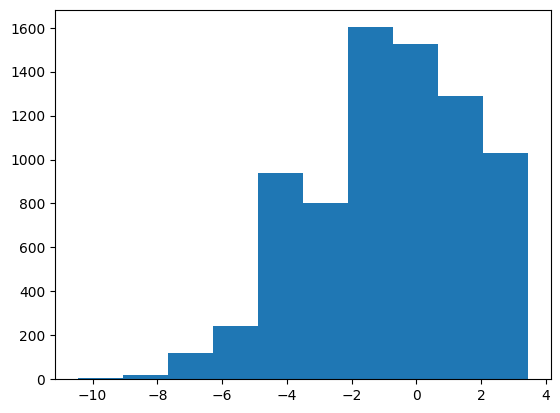

In [25]:
new_k_list = []
for K_list in K_lists:
    if len(K_list) > 7000:
        new_k_list = new_k_list + K_list[7000:]

plt.hist(new_k_list)

(array([ 5613.,  9752.,  8408.,  5986., 10415., 21730.,  3795.,   322.,
           73.,    30.]),
 array([4.05682806e-04, 1.02438560e+00, 2.04836551e+00, 3.07234542e+00,
        4.09632534e+00, 5.12030525e+00, 6.14428516e+00, 7.16826508e+00,
        8.19224499e+00, 9.21622490e+00, 1.02402048e+01]),
 <BarContainer object of 10 artists>)

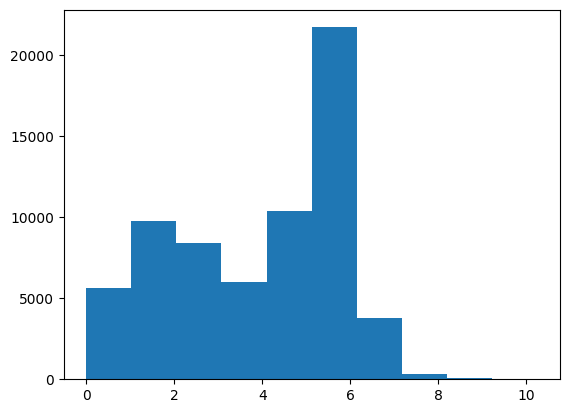

In [30]:
new_tl_list = []
for tl_list in TL_lists:
    #print(tl_list[5000:]) 
    #if len(tl_list) > 1000:
    new_tl_list = new_tl_list + tl_list[100:]

plt.hist(new_tl_list)